# What is QUANTIZED Model? 
> Quantization in Machine Learning (ML) is the process of converting data in FP32 (floating point 32 bits) to a smaller precision like INT8 (Integer 8 bit) and perform all critical operations like Convolution in INT8 and at the end, convert the lower precision output to higher precision in FP32.

>This sounds simple but as you can imagine that converting a floating point to integer results in error that can grow up through calculations, maintaining the accuracy is critical. In Quantization, accuracy is within 1% of the original accuracy.

>In terms of performance, as we are dealing with 8 bits instead of 32 bits, we should be theoretically 4 times faster. In real life applications, speedup of at least 2X is observed.



>  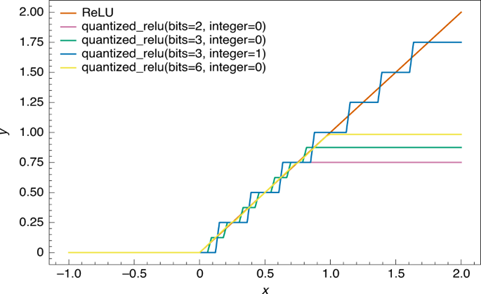

**ADVANTAGES:**
> •	Increases Power Efficiency for two reasons: reduced memory access costs and increased compute efficiency.

> •	Using the lower-bit quantized data requires less data movement, both on-chip and off-chip, which reduces memory bandwidth and saves significant energy.

> •	Easy to implement on hardware devices, for example FPGAs giving least Inference Time.





---
> We tested various PyTorch's built-in Quantized model, but mostly models becomes unstable after Feature Extraction. Only we found **ResNet-18** stable after *Feature Extraction.*

> **ResNet-18 :** A convolutional neural network, a *72-layer architecture* with 18 layers deep, used classify images into 1000 object categories, such as keyboard, mouse, pencil, and many animals.


---




# Import Necessary Libraries

At first, we need to import some packages for implementation.

In [ ]:
#Importing Libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os, glob, time, copy, random, zipfile
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, recall_score,precision_score
from tqdm import tqdm_notebook as tqdm
%matplotlib inline


The latest PyTorch's version upon which we worked is ***1.12.1+cu113***




In [ ]:
#Importing PYTORCH Framework Libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
from torchvision.utils import make_grid
import torch.nn.functional as F
import torchvision
from torchvision import models, transforms

# Directing Pre-Processed Datasets 
  

Proper dataset preparation and loading complete data in required format is the most attention-demanding process in Machine Learning following the correct initialized variables, if any

> **Importing the Preprocessed Datasets**: 
   Make sure to mount drive, if you saved your preprocessed dataset on your drive before.

>  Format Verification and Listing
      As discussed before, dataset has been preprocessed into ‘.png’ formatted images. Do insure to check and load for only ‘.png’ images in order to bypass Google Colab generated checkpoints.
      Initialize variables containing list of images for better processing and computational speed


In [ ]:
#Directing directives of stored preprocessed data
train_path = '/content/drive/MyDrive/data/train'
valid_path = '/content/drive/MyDrive/data/valid'
test_path = '/content/drive/MyDrive/data/test'

#Checking for only 'png' formatted 
train_list = glob.glob(os.path.join(train_path, '*.png'))
valid_list = glob.glob(os.path.join(valid_path, '*.png'))
test_list = glob.glob(os.path.join(test_path, '*.png'))

# Datasets Visualization

>  Let us visualize some random images from all datasets; namely ‘Train’, ‘Valid’ and ‘Test, in order to insure preprocessed image dataset and correct loading and listing.


>    Here loops are used for the purpose of displayed different images of cats and dogs,  each time you run the cell.

TOTAL TRAIN IMAGES ARE : 600


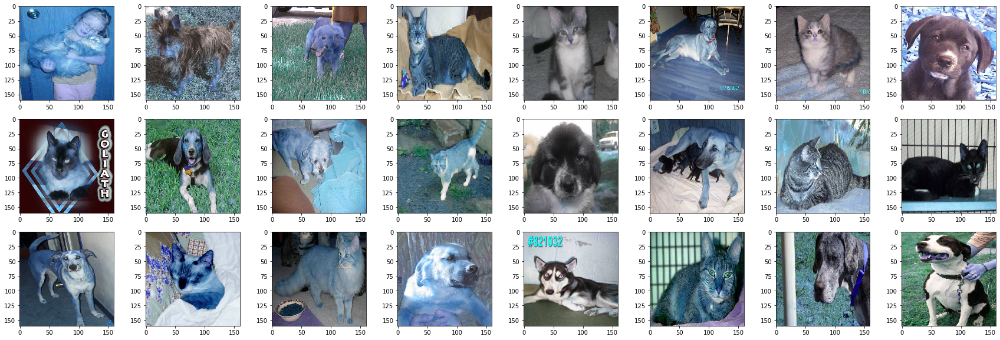

In [ ]:
#Train Dataset
_, _, files = next(os.walk(train_path))
file_count = print('TOTAL TRAIN IMAGES ARE : {}'.format(len(files)))
r = list(range(len(files)//2))
random.shuffle(r)
j=0
fig = plt.figure(figsize=(30,10))
for i in r:
    img_path = os.path.join(train_path, 'cat.{}.png'.format(i))
    if (os.path.exists(img_path )) == True: 
       img = Image.open(img_path)
    else:
       img_path = os.path.join(train_path, 'dog.{}.png'.format(i))
       img = Image.open(img_path)
    j+=1
    plt.subplot(3,8, j)
    plt.imshow(img) 
    if j>=24: break
plt.show()

TOTAL Validation IMAGES ARE : 300


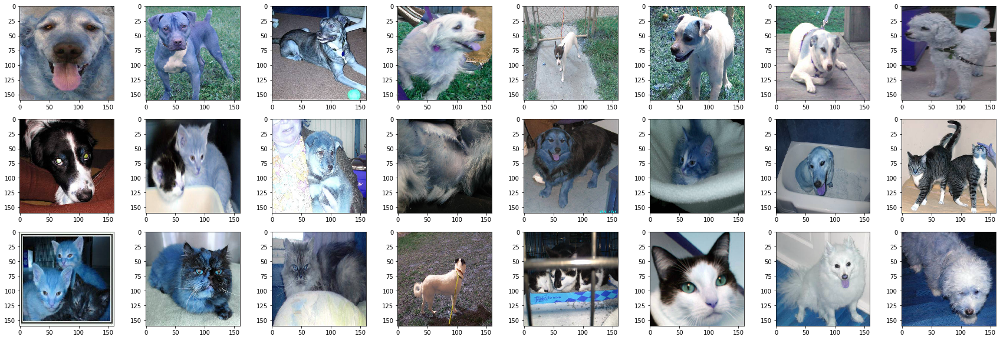

In [ ]:
#Validation Dataset
_, _, files = next(os.walk(valid_path))
file_count = print('TOTAL Validation IMAGES ARE : {}'.format(len(files)))
r = list(range(len(files)//2))
random.shuffle(r)
j=0
fig = plt.figure(figsize=(30,10))
for i in r:
    img_path = os.path.join(valid_path, 'cat.{}.png'.format(i))
    if (os.path.exists(img_path )) == True: 
       img = Image.open(img_path)
    else:
       img_path = os.path.join(valid_path, 'dog.{}.png'.format(i))
       img = Image.open(img_path)
    j+=1
    plt.subplot(3,8, j)
    plt.imshow(img) 
    if j>=24: break
plt.show()

TOTAL TEST IMAGES ARE : 300


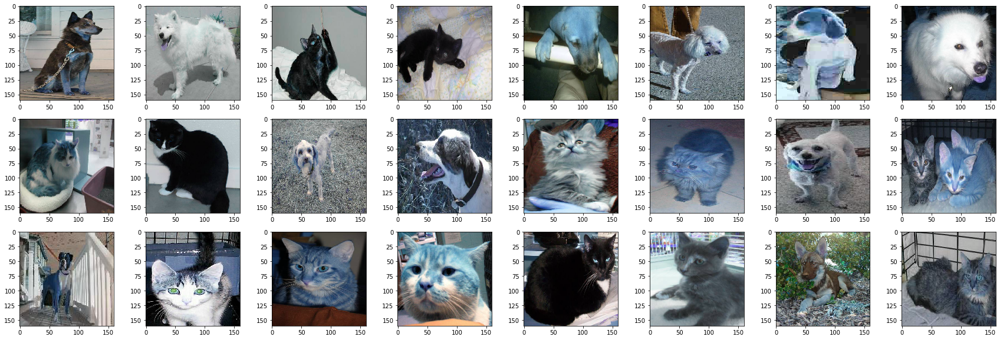

In [ ]:
#Test Dataset
_, _, files = next(os.walk(test_path))
file_count = print('TOTAL TEST IMAGES ARE : {}'.format(len(files)))
r = list(range(len(files)))
random.shuffle(r)
j=0
fig = plt.figure(figsize=(30,10))
for i in r:
    img_path = os.path.join(test_path, '{}.png'.format(i))
    img = Image.open(img_path)
    j+=1
    plt.subplot(3,8, j)
    plt.imshow(img) 
    if j>=24: break
plt.show()

# Defining Classes

**Transformation and Augmentation**
> Mentioned earlier, dataset is released in Kaggle. Original dataset has 12500 images of dogs and 12500 images of cats, in 25000 images in total. That's a huge amount to train the model. But in our case, we just only use 600 images for training, 300 images for validation, and 300 images for test.

> Actually, 300 images are not enough datasets for training. But we can size-up the dataset with transformation. Yes, it is **Data Augmentation.** There are several techniques to transform the image. In this case, we will use following transformations:
*	Resize: Of course, model input must be the same size .So we need to resize our transformed image to fixed size. This fixed size gets declared by variable, defined later, based upon model selected.
*	Random Affine: We can use linear mapping method by preserving points, straight lines, and planes; comes from TorchVision.
*	Random Horizontal Flips: We can horizontally flip a targeted image with a given probability.

> One more API we need to implement is normalize. Normalization is one of method for rescaling. There are several techniques for normalization. But in this API, our normalize function will be based upon mean standard deviation values.

> **NOTE:**
*	If we use .Normalize( (0, 0, 0), (1, 1,1) ) instead of .Normalize (mean, std), we found to loss accuracy, both train and test, by 2 – 4%
*	Same transformation will be applied on Testing Data as now declared for Validation Data.



In [ ]:
#Defining Two Transformation (Testing will also use that of Validation)
class CustomTransform():
    
    def __init__(self, resize, mean, std):
        self.data_transform = {
            'train': transforms.Compose([
        transforms.Resize(size),
        transforms.RandomAffine(0, shear=10, scale=(0.8,1.2)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
            'valid':   transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(size),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ]),
        }
        
    def __call__(self, img, phase):
        return self.data_transform[phase](img)

**Retrieval of Images and Labels**
> Usually dataset pipeline is built for training and test dataset. Actually, it is very efficiency for memory usage, because its type is python generator. We are done with it in Preprocessed step as following,

>	DATA
*	Train
*	Valid
*	Test

> Now we need to extract parent name as a target, to be later called by dataloader.


In [ ]:
class DogCatDataset(data.Dataset):
    
    def __init__(self, file_list, transform=None, phase='train'):    
        self.file_list = file_list
        self.transform = transform
        self.phase = phase
        
    def __len__(self):
        return len(self.file_list)
    
    def __getitem__(self, idx):
        
        image_loc = self.file_list[idx]
        image = Image.open(image_loc)
        
        img_transformed = self.transform(image, self.phase)
        
        # Get Target
        target = image_loc.split('/')[-1].split('.')[0]
        if     target == 'dog':      target = 0
        elif   target == 'cat':      target = 1
        else:  print('Wrong DATASET')

        return img_transformed, target


#HyperParameters

Tuned via performing various trainings and tests, checked that current model inputs **(224 x 224)** pixels image.

In [ ]:
#Defining Variables
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
size = 224
batch = 32   #Gives best result due to same Tensor .dtype

#Checking for GPU

>  Let’s check for availability of GPU.GPU helps to perform the training on large and complex datasets with ease as compared to CPU. So availability of GPU gives advantage on faster training of the model.

>   Since Google Colab provides a free ***12GB NVIDIA Tesla K80*** GPU to run up to 12 hours continuously, so using following command makes the code much flexible with respect to compute resources.

>   But here all the testing is performed on free version of Google Colab, so in order to prevent disturbance in runtime, hardware accelerator is set to **‘default’**, setting to GPU or TPU have significant impact on processing time




In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

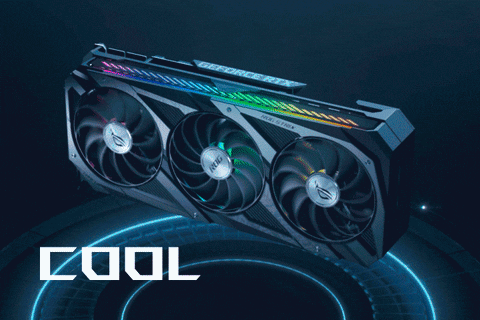

# Data Loader

Load the Training and Validation Dataset by calling previous made classes and print some check-marks for verification.

In [ ]:
#Making separate Datasets by call Custom Dataset Class
train_dataset = DogCatDataset(train_list, transform=CustomTransform(size, mean, std), phase='train')
valid_dataset = DogCatDataset(valid_list, transform=CustomTransform(size, mean, std), phase='valid')

# Verifivation
print('Verification')
index = 0
print(train_dataset.__getitem__(index)[0].size())
print(train_dataset.__getitem__(index)[1])

Verification
torch.Size([3, 224, 224])
0


**Dictionary** has been initialized for the purpose of making code easy, and to prevent bugs. 

In [ ]:
#DataLoading (For Pytorch FrameWork)
train_dataloader = data.DataLoader(train_dataset, batch_size=batch, shuffle=True)
valid_dataloader = data.DataLoader(valid_dataset, batch_size=batch, shuffle=False)

#Dictionary for Simplifying and Compacting Code
loaderDict = {'train': train_dataloader, 'valid': valid_dataloader}

# Verification
print('Verification')
batch_iterator = iter(train_dataloader)
inputs, target = next(batch_iterator)
print(inputs.size())
print(target)


Verification
torch.Size([32, 3, 224, 224])
tensor([0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1,
        0, 1, 0, 1, 0, 0, 1, 0])


# Check Functionality of Data Augmentation

We have successfully applied data transformation, made the batches and loaded it to the data loader. Now, let's make a check point here, and visualize some random loaded train and validation data, in form of batches, for idea

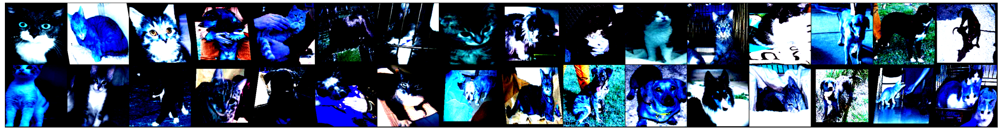

In [ ]:
#TRAINING DATALOADER
for images, labels in train_dataloader:
    
    fig, ax = plt.subplots(figsize = (40, 10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, 16).permute(1,2,0))
    break

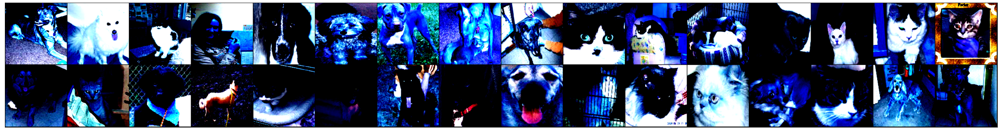

In [ ]:
#VALIDATION DATALOADER
for images, labels in valid_dataloader:
    
    fig, ax = plt.subplots(figsize = (40, 10))
    ax.set_xticks([])
    ax.set_yticks([])
    ax.imshow(make_grid(images, 16).permute(1,2,0))
    break

# Training

A function has been defined for model training, taking four arguments, 
*  Pre-trained model to be used
*  Criterion (mainly depending upon model selected)
*  Optimizer (mainly depending upon model selected) 
*  Number of epochs specified by user

In [ ]:
def train_model(model, loaderDict, criterion, optimizer, num_epoch):
    
    since = time.time()
    best_model_wts = copy.deepcopy(net.state_dict())
    accuracy  = 0.0
    model = model.to(device)
    train_losses = []
    valid_losses = []

    for epoch in range(num_epoch):
        
        print('Epoch {}/{}'.format(epoch + 1, num_epoch))
        print('-'*20)
        
        for phase in ['train', 'valid']:
            
            if phase == 'train':
                model.train()
            else:
                model.eval()
                
            epoch_loss = 0.0
            epoch_corrects = 0
            
            for inputs, target in tqdm(loaderDict[phase]):
                inputs = inputs.to(device)
                target = target.to(device)
                optimizer.zero_grad()
                
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = net(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, target)
                    
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        
                    epoch_loss += loss.item() * inputs.size(0)
                    epoch_corrects += torch.sum(preds == target.data)
                    
            epoch_loss = epoch_loss / len(loaderDict[phase].dataset)
            epoch_acc = epoch_corrects.double() / len(loaderDict[phase].dataset)
            if phase == 'train':
              train_losses.append(epoch_loss)
            elif phase == 'valid':
              valid_losses.append(epoch_loss)
            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))
            
            # deep copy the model
            if phase == 'valid' and epoch_acc > accuracy :
                accuracy  = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('High Achieved validation Accuracy: {:4f}'.format(accuracy ))
    
    np.save('qres_trainloss.npy',train_losses)
    np.save('qres_validloss.npy',valid_losses)


    # load best model weights
    model.load_state_dict(best_model_wts)
    return model


We are going to use *PyTorch’s built-in Quantized models*, but after several testings we found that these built-in models are stable on Fine Tuning, but become unstable on Feature Extraction. We only found **Resnet-18** a stable, enough for our comparison with non-Quantized Models

In [ ]:
model_fe = models.quantization.resnet18(pretrained=True, progress=True, quantize=True)
num_ftrs = model_fe.fc.in_features

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_QuantizedWeights.IMAGENET1K_FBGEMM_V1`. You can also use `weights=ResNet18_QuantizedWeights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/quantized/resnet18_fbgemm_16fa66dd.pth" to /root/.cache/torch/hub/checkpoints/resnet18_fbgemm_16fa66dd.pth


  0%|          | 0.00/11.2M [00:00<?, ?B/s]

On contradictory to non-Quantized models, where we, for Feature Extraction,simply put  ***param.requires_grad = False*** , in Quantized models we manually have to mention which layers we need to freeze and which dense layers for want to add.

In [ ]:
from torch import nn

def create_combined_model(model_fe):
  # Step 1. Isolate the feature extractor.
  model_fe_features = nn.Sequential(
    model_fe.quant,  # Quantize the input
    model_fe.conv1,
    model_fe.bn1,
    model_fe.relu,
    model_fe.maxpool,
    model_fe.layer1,
    model_fe.layer2,
    model_fe.layer3,
    model_fe.layer4,
    model_fe.avgpool,
    model_fe.dequant,  # Dequantize the output
  )

  # Step 2. Create a new "head"
  new_head = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Linear(num_ftrs, 2),
  )

  # Step 3. Combine, and don't forget the quant stubs.
  new_model = nn.Sequential(
    model_fe_features,
    nn.Flatten(1),
    new_head,
  )
  return new_model

In [ ]:
import torch.optim as optim
net = create_combined_model(model_fe)
net = net.to(device)

criterion = nn.CrossEntropyLoss()

# Note that we are only training the head.
optimizer = optim.Adam(net.parameters())

In [ ]:
num_epoch = 15
net_trained = train_model(net, loaderDict, criterion, optimizer, num_epoch)

Epoch 1/15
--------------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.7057 Acc: 0.5967


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.3277 Acc: 0.8967
Epoch 2/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2996 Acc: 0.8900


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1989 Acc: 0.9400
Epoch 3/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2345 Acc: 0.9133


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1627 Acc: 0.9433
Epoch 4/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.2019 Acc: 0.9133


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1499 Acc: 0.9467
Epoch 5/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1818 Acc: 0.9267


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1393 Acc: 0.9500
Epoch 6/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1780 Acc: 0.9250


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1348 Acc: 0.9467
Epoch 7/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1620 Acc: 0.9250


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1242 Acc: 0.9500
Epoch 8/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1598 Acc: 0.9383


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1215 Acc: 0.9567
Epoch 9/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1497 Acc: 0.9400


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1151 Acc: 0.9567
Epoch 10/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1369 Acc: 0.9517


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1145 Acc: 0.9600
Epoch 11/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1676 Acc: 0.9283


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1081 Acc: 0.9600
Epoch 12/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1379 Acc: 0.9433


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1069 Acc: 0.9633
Epoch 13/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1362 Acc: 0.9450


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1055 Acc: 0.9667
Epoch 14/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1350 Acc: 0.9467


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1081 Acc: 0.9667
Epoch 15/15
--------------------


  0%|          | 0/19 [00:00<?, ?it/s]

train Loss: 0.1477 Acc: 0.9383


  0%|          | 0/10 [00:00<?, ?it/s]

valid Loss: 0.1129 Acc: 0.9567
Training complete in 9m 33s
High Achieved validation Accuracy: 0.966667


Arrays containing *Training and Validation Losses* have been stored to working directory and can be displayed as running following cell.

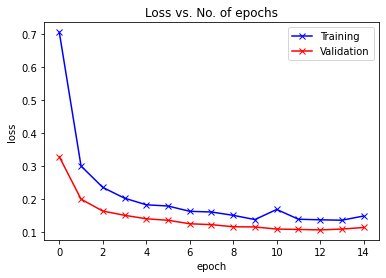

In [ ]:
train_loss = np.load('qres_trainloss.npy')
valid_loss= np.load('qres_validloss.npy')
plt.plot(train_loss, '-bx')
plt.plot(valid_loss, '-rx')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Training', 'Validation'])
plt.title('Loss vs. No. of epochs');

# Saving the Model

**We can’t save PyTorch’s built-in Quantized model after Feature Extraction on memory due to *Stat_Dict() fusion*. If becomes successful on saving model after passing through complex process, the model becomes Unstable.**

# Testing

Now, test the built model on Test Data, store the ID and predicted target as Pandas Dataframe, and save the final report as ***‘.csv’*** format

In [ ]:
# Prediction
id_list = []
propababilty_list = []

with torch.no_grad():
    for test_loc in tqdm(test_list):
        img = Image.open(test_loc)
        _id = int(test_loc.split('/')[-1].split('.')[0])

        transform = CustomTransform(size, mean, std)
        img = transform(img, phase='valid')
        img = img.unsqueeze(0)
        img = img.to(device)

        net_trained.eval()

        outputs = net_trained(img)
        propababilty = F.softmax(outputs, dim=1)[:, 1].tolist()

        id_list.append(_id)
        propababilty_list.append(propababilty[0])
    
    
dataFrame = pd.DataFrame({
    'id': id_list,
    'probability': propababilty_list
})

dataFrame.sort_values(by='id', inplace=True)
dataFrame.reset_index(drop=True, inplace=True)

dataFrame.to_csv('evaluation_report.csv', index=False)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  


  0%|          | 0/300 [00:00<?, ?it/s]

Predicted dataframe has been previously saved on working directory as ***evaluation_report.csv***, now in order to access and read dataframe, run the following cell.

In [ ]:
display(dataFrame)

,id,probability
0,0,0.991683
1,1,0.014572
2,2,0.036102
3,3,0.990313
4,4,0.022160
...,...,...
295,295,0.979470
296,296,0.008963
297,297,0.006139
298,298,0.280596


**Scatter Plot :** Visualize dataframe in form of *Scatter plot*.

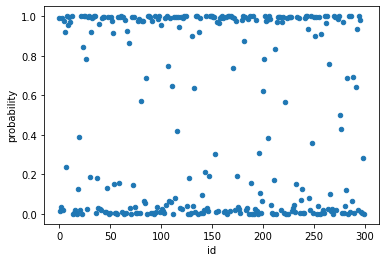

In [ ]:
dataFrame.plot(
    x = 'id',
    y='probability',
    kind='scatter'
)
plt.show()

Set the threshold, and make array of predicted target either as **0 or 1.**

In [ ]:
temp = (dataFrame["probability"]) 
y_pred = np.zeros(300, dtype=int)
for i in range(len(temp)):
  if temp[i] > 0.49:
   y_pred[i] = 1
#Verification
print(y_pred)

[1 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 0
 0 0 1 0 0 1 1 1 0 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 1
 0 0 0 1 1 0 1 1 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 1 1 0 1 0 0 0 1 0 1 1 0 1 0
 1 0 1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 1 0 0 0
 1 1 1 1 1 0 0 1 0 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 0 0 0 1 1 1 1 0 0
 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 1 1 1 1 0 1 1 0 0 0 0 1 0 1 1 1 1 0 1 1 0
 1 0 1 0 1 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 0 1 0 0 1 1 1 0 0 1 0 1 0
 0 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1
 0 0 0 0]


Upload the given Test Labels array and **assert** if length of actual labels array is not equal to predicted labels array. 

In [ ]:
y_actual = np.load('/content/labels_test.npy')
print(y_actual)
assert ((len(y_actual)) != (len(y_pred)), f"MISMATCHED LENGTHS" )

[1 0 0 1 0 1 1 0 1 1 1 1 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 0 1 1 0 1 1 1 1 1 0
 0 0 1 0 0 1 1 1 0 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 1 0 1 0 1 0 1 1 0 0 1 0 1
 0 0 0 1 1 0 1 1 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 1 1 0 1 0 0 0 1 0 1 1 0 1 0
 0 0 1 0 1 0 1 1 0 1 0 1 1 1 0 0 0 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 1 1 1 0 1
 1 1 1 1 1 0 0 1 0 1 1 1 1 1 0 0 1 0 1 1 0 1 1 1 1 0 1 0 0 0 0 1 1 1 1 0 0
 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 1 1 1 1 1 0 1 1 0 0 0 0 0 0 1 1 1 1 0 1 1 0
 0 0 1 0 1 1 1 0 0 0 0 0 1 1 0 0 0 0 0 1 1 1 1 0 0 1 1 0 1 1 1 0 0 1 0 1 0
 0 0 1 1 1 0 1 0 0 0 0 1 1 0 1 1 1 1 0 0 1 0 0 0 1 0 1 0 1 0 1 0 1 1 0 1 1
 0 0 0 0]


<>:3: SyntaxWarning: assertion is always true, perhaps remove parentheses?
<>:3: SyntaxWarning: assertion is always true, perhaps remove parentheses?
<>:3: SyntaxWarning: assertion is always true, perhaps remove parentheses?
<ipython-input-41-77a8b4e9ce17>:3: SyntaxWarning: assertion is always true, perhaps remove parentheses?
  assert ((len(y_actual)) != (len(y_pred)), f"MISMATCHED LENGTHS" )


# Results

It’s time to  visual the wrong predicted images by model by comparison between arrays.

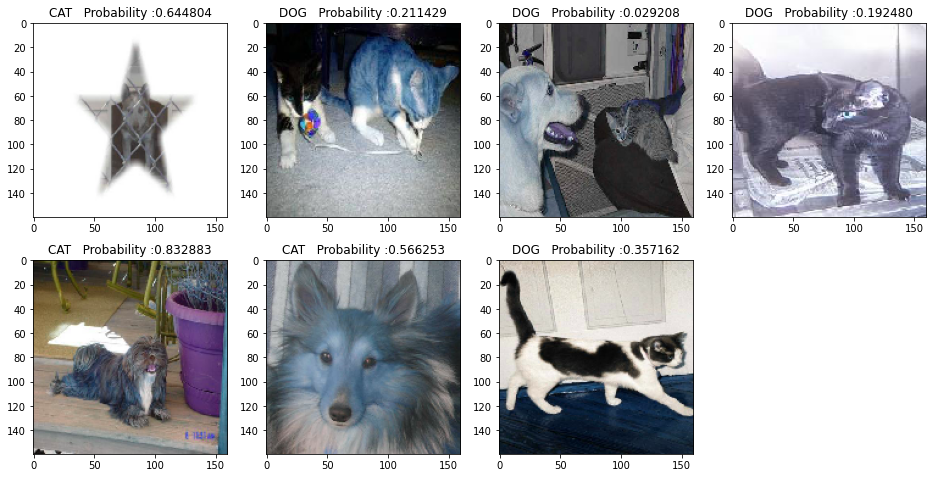

7


In [ ]:
mismatch = 0
id_list = []
fig = plt.figure(figsize=(16,8))
j=1
class_ = {1: 'CAT ', 0: 'DOG '}
for i in range(len(y_actual)):
  if y_actual[i] != y_pred[i]:
    img_path = os.path.join(test_path, '{}.png'.format(i))
    img = Image.open(img_path)
    #print(y_pred[i])
    #print(temp[i])
    plt.subplot(2, 4, j)
    plt.title(str(class_[y_pred[i]]) + "  Probability :{:4f}".format(temp[i]))
    plt.imshow(img) 
    mismatch+=1
    j+=1
plt.show()
print(mismatch)

Now, let's check model accuracy by terms including **F1 Score, Precision and Recall Scores.**


Total Mismatched : 7
F1_SCORE : 0.976589
Precision_Score : 0.979866
Recall_Score : 0.973333


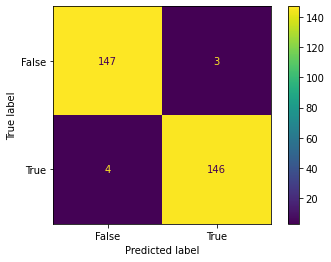

In [ ]:
print('Total Mismatched : {}'.format(mismatch))
print('F1_SCORE : {:4f}'.format(f1_score(y_actual, y_pred, average="binary")))
print('Precision_Score : {:4f}'.format(precision_score(y_actual, y_pred, average="binary")))
print('Recall_Score : {:4f}'.format(recall_score(y_actual, y_pred, average="binary")))

from sklearn import metrics
confusion_matrix = metrics.confusion_matrix(y_actual, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

> **F1 Score :** Combines the precision and recall of a classifier into a single metric by taking their *Harmonic Mean,* and is is primarily used to compare the performance of two classifiers

> **Precision Score :** The ratio *tp / (tp + fp)* where tp is the number of true positives and fp the number of false positives.

> **Recall Score:** Represents the model's ability to correctly predict the positives out of actual positives

> **Confusion Matrix :** A useful machine learning method which allows you to measure Recall, Precision, and Accuracy. Below given can be used to know the terms:  True Positive, True Negative, False Negative, and True Negative. True Positive.

# Inference Time

>   In deep learning, inference time is the amount of time it takes for a machine learning model to process new data and make a prediction.
      
> To calculate estimated Inference Time, random 6 images have been taken from Google Search, uploaded on Drive and following code is run.

In [ ]:
#Estimating Inference Time
import torch
import time 
from torchvision import transforms
import torch.nn.functional as F
import glob
from PIL import Image

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

total = 0.0

mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)
transf= transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean, std)
    ])

for x in glob.glob('/content/drive/MyDrive/Images/*.jpg'):
  image = Image.open(x)
  since = time.time()
  img = transf(image)
  img = img.unsqueeze(0)
  img = img.to(device)
  pred=net_trained(img)
  pred = F.softmax(pred, dim=1)[:, 1]
  temp = pred[0] > 0.5
  if temp==1:
      print("PREDICTION = CAT ")
      print(' Probability : {:4f}'.format(pred.item()))
  else:
      print("PREDICTION = DOG ")
      print(' Probability : {:4f}'.format(1 - pred.item()))
  time_elapsed = time.time() - since
  total = total + time_elapsed

print('\n CALCULATED INFERENCE TIME : {}'.format(total/(float(6))) )


PREDICTION = CAT 
 Probability : 0.994551
PREDICTION = DOG 
 Probability : 0.556023
PREDICTION = DOG 
 Probability : 0.994042
PREDICTION = CAT 
 Probability : 0.979368
PREDICTION = CAT 
 Probability : 0.994462
PREDICTION = DOG 
 Probability : 0.829919

 CALCULATED INFERENCE TIME : 0.05548099676767985
